
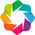

In [1]:
import holoviews as hv
hv.notebook_extension('bokeh')

In [3]:
import sys
sys.path.append('..')
from explorer.catalog import ParquetCatalog
import glob
from distributed import Client
client = Client()

files = glob.glob('../data/forced_big_test*.parq')[:1]
catalog = ParquetCatalog(files)

In [4]:
from explorer.functors import (Mag, MagDiff, CustomFunctor, DeconvolvedMoments, Column,
                            SdssTraceSize, PsfSdssTraceSizeDiff, HsmTraceSize,
                            PsfHsmTraceSizeDiff, RAColumn, DecColumn, CompositeFunctor)

funcs = [MagDiff('modelfit_CModel', 'base_PsfFlux'),
         PsfHsmTraceSizeDiff(),
         PsfSdssTraceSizeDiff(),
         DeconvolvedMoments()]

In [5]:
from explorer.dataset import QADataset

data = QADataset(catalog, funcs, flags=['calib_psfUsed'], client=client)

In [6]:
data.ds

:Dataset   [ra,dec,x,label,calib_psfUsed]   (y0,y1,y2,y3,calib_psfUsed)

In [32]:
from explorer.plots import multi_scattersky, FilterStream

In [33]:
filter_stream = FilterStream()
plot = multi_scattersky(data.ds.groupby('label'), filter_stream=filter_stream)

In [34]:
plot

:Layout
   .DynamicMap.I    :DynamicMap   [label]
   .DynamicMap.II   :DynamicMap   [label]
   .DynamicMap.III  :DynamicMap   [label]
   .DynamicMap.IV   :DynamicMap   [label]
   .DynamicMap.V    :DynamicMap   [label]
   .DynamicMap.VI   :DynamicMap   [label]
   .DynamicMap.VII  :DynamicMap   [label]
   .DynamicMap.VIII :DynamicMap   [label]

In [35]:
import parambokeh
import param

class FlagSetter(hv.streams.Stream):
    flags = param.ListSelector(default=[], objects=data.flags)

    def event(self, **kwargs):
        filter_stream.event(**kwargs)
        
example = FlagSetter(name='Flag Selector')
parambokeh.Widgets(example, callback=example.event, push=False,
                   on_init=True)

In [14]:
len(filter_dset(data.ds, filter_range=filter_stream.filter_range))

/Users/tdm/repositories/holoviews/holoviews/core/data/interface.py:200: RuntimeWarning: invalid value encountered in greater_equal
  mask &= k.start <= arr
/Users/tdm/repositories/holoviews/holoviews/core/data/interface.py:202: RuntimeWarning: invalid value encountered in less
  mask &= arr < k.stop


529